In [1]:
import os
import re
from IPython.display import clear_output
from matplotlib import pyplot as plt
import numpy as np
import pandas as pd
# from oneibl.onelight import ONE # only used for downloading data
# import wget
from utils import *
from plotting_utils import *
from analysis_utils import *
import dglm_hmm1
from pandas.errors import SettingWithCopyWarning
warnings.simplefilter(action="ignore", category=SettingWithCopyWarning)


ibl_data_path = '../data_IBL'
dfAll = pd.read_csv(ibl_data_path + '/Ibl_processed.csv')
colorsFeatures = [['#FAA61A','indigo','#99CC66','#59C3C3','#9593D9'],['#FAA61A',"#2369BD","#A9373B",'#99CC66','#59C3C3','#9593D9']]
#colorsStates = ['orange','firebrick','forestgreen']#['orange','slateblue','forestgreen'] #['#FAA61A','#59C3C3','#9593D9','#99CC66','indigo'] #['darkorange','darkblue','forestgreen','purple']
colorsStates = ['tab:orange','tab:blue', 'tab:green','tab:red']
myFeatures = [['bias','delta stimulus', 'previous choice', 'previous answer'],['bias','contrast left','contrast right', 'previous choice', 'previous answer']]
sns.set_context("talk")
# colormap = ['rebeccapurple','teal','darkturquoise','springgreen','gold']
# colormap = ['rebeccapurple','royalblue','limegreen','orange']
colormap = ['tab:purple','tab:pink','tab:cyan','yellowgreen']

In [2]:
labChosen =  ['angelakilab','churchlandlab','wittenlab']
subjectsAll = []
for lab in labChosen:
    subjects = np.unique(dfAll[dfAll['lab'] == lab]['subject']).tolist()
    subjectsAll = subjectsAll + subjects

if ('NYU-01' in subjectsAll):
    subjectsAll.remove('NYU-01')
if ('NYU-06' in subjectsAll):
    subjectsAll.remove('NYU-06')
if ('CSHL_007' in subjectsAll):
    subjectsAll.remove('CSHL_007')
if ('CSHL049' in subjectsAll):
    subjectsAll.remove('CSHL049')



In [17]:
# setting hyperparameters
sigmaList = [0] + [10**x for x in list(np.arange(-3,1,0.5,dtype=float))] + [10**x for x in list(np.arange(1,4,1,dtype=float))]
alphaList = [2*(10**x) for x in list(np.arange(-1,6,0.5,dtype=float))] 
L2penaltyW = 1
maxiter = 200
bestSigma = 1 # verified from fitting multiple sigmas
bestSigmaInd = 7
bestAlpha = 2
priorDirP = [100,10] # to read dGLMHMM1 model
fit_init_states = False
K = 3
D = 4 # number of features
sessStop = -1 # last session to use in fitting
splitFolds = 5
inits = 21

In [4]:
# NEW SAVING OF FILES AND MORE ANIMALS:
testLlAll = np.zeros((4, len(subjectsAll), len(sigmaList)))
testAccuracyAll = np.zeros((4, len(subjectsAll), len(sigmaList)))
bestTestLl = np.zeros((4, len(subjectsAll)))
bestTestAccuracy = np.zeros((4, len(subjectsAll)))

for idx in range(0, len(subjectsAll)):
    subject = subjectsAll[idx]
    testLl = []
    testAccuracy = []
    avgTestLl = []
    avgTestAccuracy = []
    for K in [1,2,3,4]:
        data = np.load(f'../data_IBL/{subject}/{subject}_ALL-PARAM_D={D}_{K}-state_multiple-sigmas_priorDirP={priorDirP}_L2penaltyW={L2penaltyW}_untilSession{sessStop}.npz')
        # fig, axes = plt.subplots(1,figsize=(20,8), dpi=400)
        # fig.suptitle(f'{subject}')
        # for fold in range(0, splitFolds):
        #     plot_testLl_CV_sigma(data['testLl'][fold], sigmaList=sigmaList, label=f'K={K} fold {fold}', color=colormap[K-1], axes=axes)
        avgTestLl.append(np.mean(data['testLl'],axis=0))
        avgTestAccuracy.append(np.mean(data['testAccuracy'],axis=0))
    avgTestLl = [x - avgTestLl[0][0] for x in avgTestLl] # normalizing to GLM-HMM sigma=0 K=1
    avgTestAccuracy = [x - avgTestAccuracy[0][0] for x in avgTestAccuracy]
    
    for K in [1,2,3,4]:
        testLlAll[K-1][idx] = avgTestLl[K-1]
        testAccuracyAll[K-1][idx] = avgTestAccuracy[K-1]

    bestSigmaInd = 7 # Choosing best sigma index across animals
    for K in [1,2,3,4]:
        bestTestLl[K-1][idx] = avgTestLl[K-1][bestSigmaInd] - avgTestLl[0][bestSigmaInd] # delta
        bestTestAccuracy[K-1][idx] = avgTestAccuracy[K-1][bestSigmaInd] - avgTestAccuracy[0][bestSigmaInd] # delta
    
    # # Plotting delta test ll averaged across folds for per-animal plots
    # fig, axes = plt.subplots(1,figsize=(20,8), dpi=400)
    # fig.suptitle(f'{subject}')
    # fig.tight_layout()
    # for K in range(1,5):
    #     plot_testLl_CV_sigma(avgTestLl[K-1], sigmaList=sigmaList, label=f'K={K}', color=colormap[K-1], axes=axes)
    # axes.set_ylabel("Delta Test Ll (per trial)")

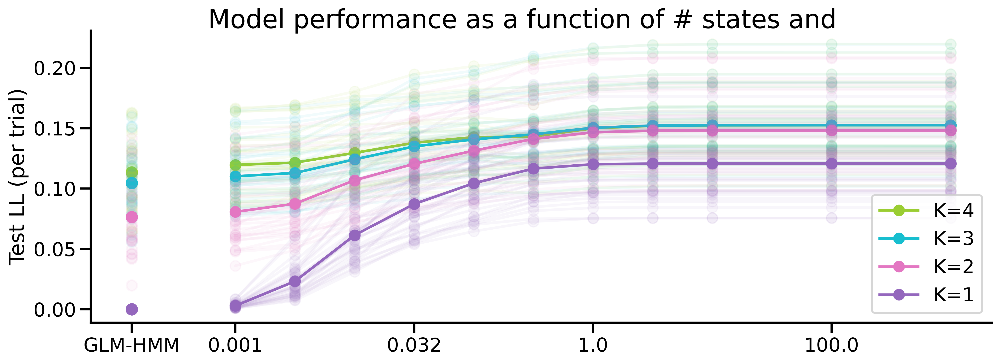

In [5]:
# Plotting one plot with all animals and their mean
fig, axes = plt.subplots(1, figsize = (12,4.5), dpi=400)
fig.tight_layout()
# axes.set_title('averaged across all animals')
for K in range(4,0,-1):
    for idx in range(0, len(subjectsAll)):
        subject = subjectsAll[idx]
        plot_testLl_CV_sigma(testLlAll[K-1][idx], sigmaList=sigmaList, label=None, color=colormap[K-1], axes=axes, alpha=0.06)

    plot_testLl_CV_sigma(np.mean(testLlAll[K-1], axis=0), sigmaList=sigmaList, label=f'K={K}', color=colormap[K-1], axes=axes, alpha=1)
axes.set_ylabel('Test LL (per trial)')
axes.set_xlabel('')
axes.spines[['right', 'top']].set_visible(False)
fig.suptitle('Model performance as a function of # states and ', size=22)
plt.savefig(f'../figures/TestLl_vs_states_sigma_all-animals.png', bbox_inches='tight', dpi=400)

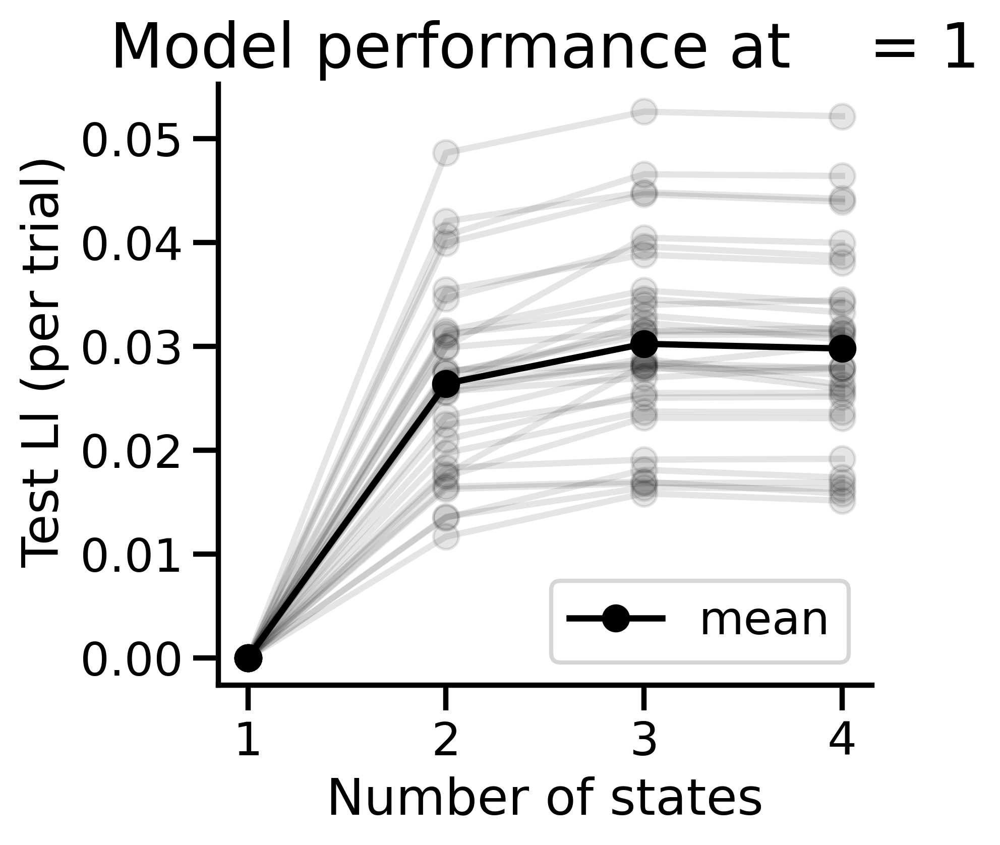

In [6]:
fig, axes = plt.subplots(1,figsize=(4.5,4), dpi=400)
fig.tight_layout()
for idx in range(0, len(subjectsAll)):
    axes.plot([1,2,3,4],bestTestLl[:,idx],'-o', color='black',alpha=0.1)
    axes.set_xticks([1,2,3,4])
# plotting mean across all animals
axes.plot([1,2,3,4], np.mean(bestTestLl, axis=1), '-o', color='black',alpha=1, label='mean')
axes.set_title(f'sigma={np.round(sigmaList[bestSigmaInd],2)}')
axes.set_xlabel('Number of states')
axes.set_ylabel('   Test Ll (per trial)')
axes.spines[['right', 'top']].set_visible(False)
axes.set_title('Model performance at    = 1', size=22)
axes.legend(loc='lower right')
plt.savefig(f'../figures/TestLl_vs_states_sigma=1_all-animals.png', bbox_inches='tight', dpi=400)

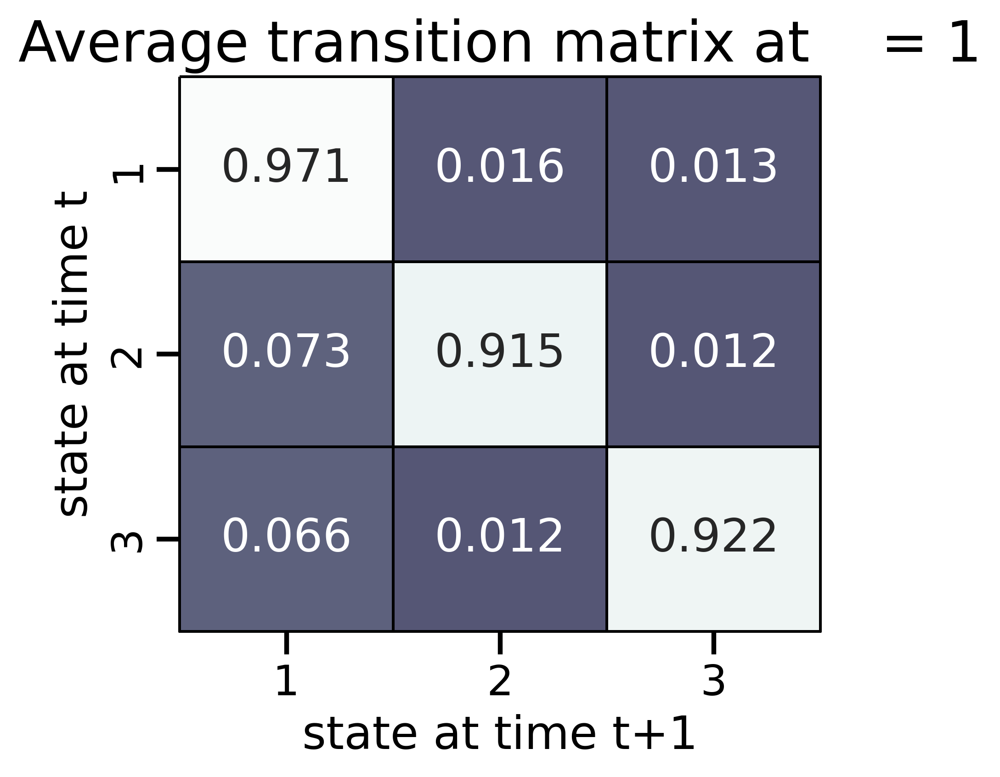

In [14]:
# Reading parameters and plotting them at best sigma for 
bestSigmaInd = 7 # equivalent to sigma=1
K = 3

allP = np.zeros((len(subjectsAll), K, K))   

for idx in range(0, len(subjectsAll)):
    subject=subjectsAll[idx]
    _, _, sessInd, correctSide = get_mouse_design(dfAll, subject, sessStop=sessStop, D=D)
    data = np.load(f'../data_IBL/{subject}/{subject}_ALL-PARAM_D={D}_{K}-state_multiple-sigmas_priorDirP={priorDirP}_L2penaltyW={L2penaltyW}_untilSession{sessStop}.npz')
    allP[idx] = np.mean(data['allP'], axis=0)[bestSigmaInd]

plt.figure(figsize=(4.5, 4), dpi=400)
K = np.mean(allP, axis=0).shape[0] # 
s = sns.heatmap(np.round(np.mean(allP, axis=0),3),annot=True, vmin=-0.6, vmax=1,cmap='bone', fmt='g', linewidths=1, linecolor='black',clip_on=False, cbar=False)
s.set(xlabel='state at time t+1', ylabel='state at time t', title=f'', xticklabels=range(1,K+1), yticklabels=range(1,K+1))
plt.title('Average transition matrix at    = 1', size=22)
plt.savefig(f'../figures/AverageP_2-state_sigma=1_allAnimals.png', bbox_inches='tight', dpi=400)
      

In [18]:
# INIT 0 is from global one
allW = np.empty((len(subjectsAll)), dtype=object)
allP = np.empty((len(subjectsAll)), dtype=object)

for idx in range(0,len(subjectsAll)):
    subject=subjectsAll[idx]
    _, _, sessInd, correctSide = get_mouse_design(dfAll, subject, sessStop=sessStop, D=D)
    param = np.load(f'../data_IBL/{subject}/{subject}_ALL-PARAM_D={D}_{K}_state_alpha={bestAlpha}_multiple-initsP_L2penaltyW={L2penaltyW}_untilSession{sessStop}.npz')
    allP[idx] =  param['allP'][0] # starting from best dGLMHMM1 fit
    allW[idx] =  param['allW'][0] # starting from best dGLMHMM1 fit
    

In [19]:
# Plotting weights and transition matrix averaged across all animals - first 70 sessions
maxSess = 75
Kplot = [3]
bestSigmaInd = 7
reorderFeatures = [1,0,2,3] 
for K in Kplot:
    arrW = np.ma.empty((maxSess, K, D, 2, len(subjectsAll)))
    arrW.mask = True

    fig, axes = plt.subplots(D, 1,figsize=(16,4*D+1), sharex=True)
    fig.tight_layout()

    avgP = []
    avgW = []
    for idx in range(0,len(subjectsAll)):
        subject = subjectsAll[idx] 
        _, _, sessInd, _ = get_mouse_design(dfAll, subject, sessStop=sessStop, D=D)

        avgW.append(allW[idx][sessInd[:-1]]) 
        avgP.append(allP[idx][sessInd[:-1]])
        stop = min(avgW[idx].shape[0], maxSess)
        arrW[:stop, :K, :D, :2, idx] = avgW[idx][:stop]
        plotting_weights_per_feature(-(avgW[idx][:stop,:,reorderFeatures]), [x for x in range (0, stop)], axes, yLim=[[-0.5,8.2],[-2.1,2.1],[-2.1,2.1],[-2.1,2.1]], colors=colorsStates, labels=['stimulus','bias','previous choice','previous correct answer'], linewidth=5, linestyle='-', alpha=0.08, legend=False, sortedStateInd=None)
        
    plotting_weights_per_feature(-(arrW.mean(axis=4)[:,:,reorderFeatures]), [x for x in range (0, maxSess)], axes, yLim=[[-0.5,8.2],[-2.1,2.1],[-2.1,2.1],[-2.1,2.1]], colors=colorsStates, labels=['stimulus','bias','previous choice','previous correct answer'], linewidth=5, linestyle='-', alpha=1, legend=True, sortedStateInd=None)
    # # plotting transition matrix averaged across folds
    # fig, axes = plt.subplots()
    # plot_transition_matrix(np.mean(avgP, axis=0), title='Averaged', sortedStateInd=None) # not sorted
          

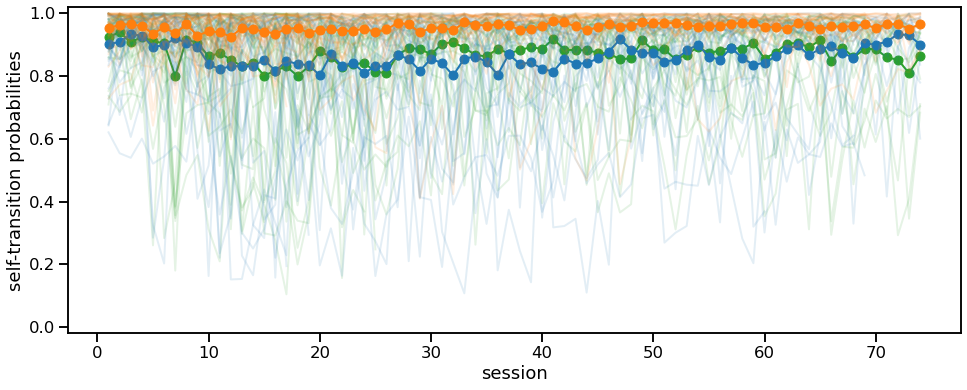

In [48]:
# Plotting weights and transition matrix averaged across all animals - first 70 sessions
maxSess = 75
Kplot = [3]
bestSigmaInd = 7
reorderFeatures = [1,0,2,3] 
fig, axes = plt.subplots(1, figsize = (16,6))
for K in Kplot:
    arrP = np.ma.empty((maxSess, K, K, len(subjectsAll)))
    arrP.mask = True

    avgP = []
    for idx in range(0,len(subjectsAll)):
        subject = subjectsAll[idx] 
        _, _, sessInd, _ = get_mouse_design(dfAll, subject, sessStop=sessStop, D=D)

        avgP.append(allP[idx][sessInd[:-1]])
        stop = min(avgW[idx].shape[0], maxSess)
        arrP[:stop, :K, :K, idx] = avgP[idx][:stop]
        sessInd = range(0,stop)
        sess = len(sessInd)-1
        for i in range(0,avgP[idx][:stop].shape[1]):
            axes.plot(range(1,sess+1), avgP[idx][:stop][sessInd[:-1],i,i], linestyle='-', linewidth=2, color=colorsStates[i], label=f'state {i+1}', zorder=avgP[idx][:stop].shape[1]-i, alpha=0.12)
        
        # plotting_self_transition_probabilities(avgP[idx][:stop], range(0,stop), axes, title='', linestyle='-', linewidth=2, save_fig=False, sortedStateInd=None, colorsStates=colorsStates)
    
    plotting_self_transition_probabilities(arrP.mean(axis=3), range(0,maxSess), axes, title='', linewidth=2, save_fig=False, sortedStateInd=None, colorsStates=colorsStates)
    axes.set_ylim(-0.02,1.02)

    # # plotting transition matrix averaged across folds
    # fig, axes = plt.subplots()
    # plot_transition_matrix(np.mean(avgP, axis=0), title='Averaged', sortedStateInd=None) # not sorted
          

In [49]:
# Computing posterior latents across animals
allGamma = np.empty((len(subjectsAll)), dtype=object)
K = 3
truepi = np.ones((K))
for idx in range(0,len(subjectsAll)):
    subject=subjectsAll[idx]
    x, y, sessInd, correctSide = get_mouse_design(dfAll, subject, sessStop=sessStop, D=D)
    N = sessInd[-1]
    presentAll = np.ones((N))
    dGLM_HMM = dglm_hmm2.dGLM_HMM2(N,K,D,2)
    allGamma[idx] = dGLM_HMM.get_posterior_latent(allP[idx], truepi, allW[idx], x, y, presentAll, sessInd, sortedStateInd=None)


/Volumes/Lenca_SSD/github/Pillow_dGLM-HMM/code/plotting_utils.py:355: RuntimeWarning: Mean of empty slice
  axes.plot(range(1,len(sessInd)), np.nanmean(np.array([blocksStateRight,blocksStateLeft]),axis=0), color='black',label='mean')
/Volumes/Lenca_SSD/github/Pillow_dGLM-HMM/code/plotting_utils.py:355: RuntimeWarning: Mean of empty slice
  axes.plot(range(1,len(sessInd)), np.nanmean(np.array([blocksStateRight,blocksStateLeft]),axis=0), color='black',label='mean')
/Volumes/Lenca_SSD/github/Pillow_dGLM-HMM/code/plotting_utils.py:355: RuntimeWarning: Mean of empty slice
  axes.plot(range(1,len(sessInd)), np.nanmean(np.array([blocksStateRight,blocksStateLeft]),axis=0), color='black',label='mean')
/Volumes/Lenca_SSD/github/Pillow_dGLM-HMM/code/plotting_utils.py:355: RuntimeWarning: Mean of empty slice
  axes.plot(range(1,len(sessInd)), np.nanmean(np.array([blocksStateRight,blocksStateLeft]),axis=0), color='black',label='mean')
/Volumes/Lenca_SSD/github/Pillow_dGLM-HMM/code/plotting_utils.py

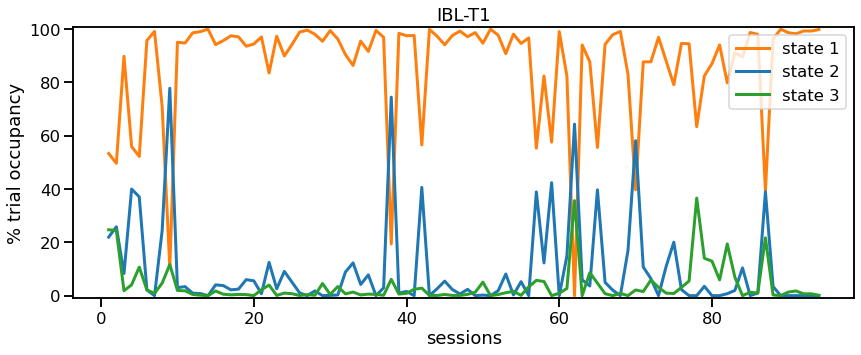

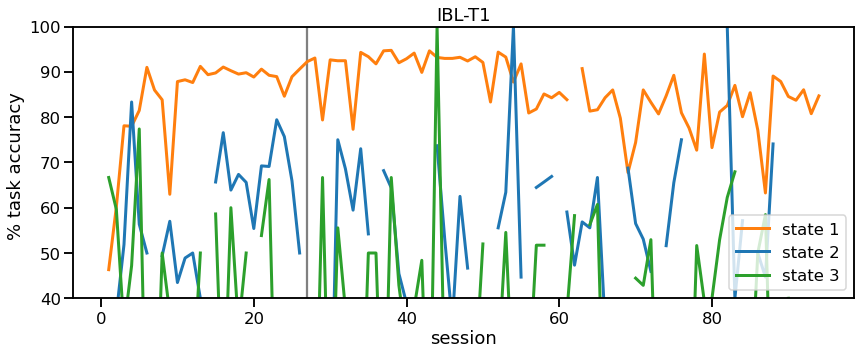

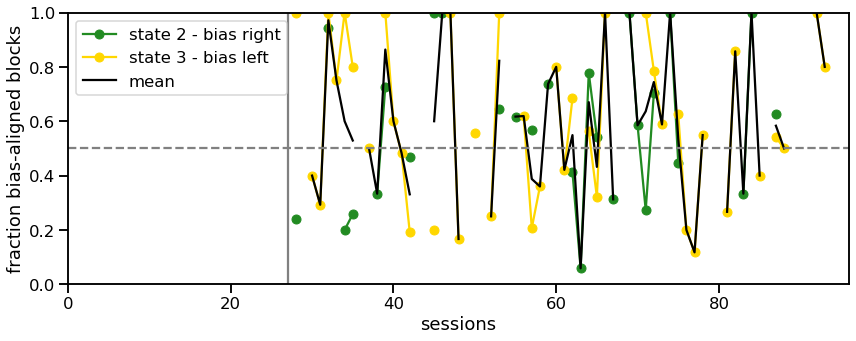

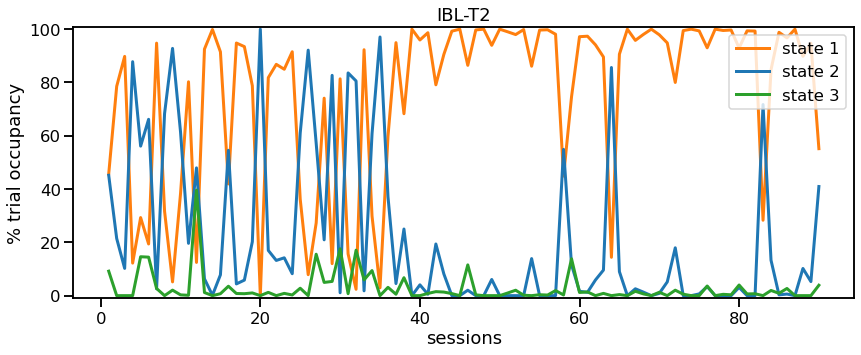

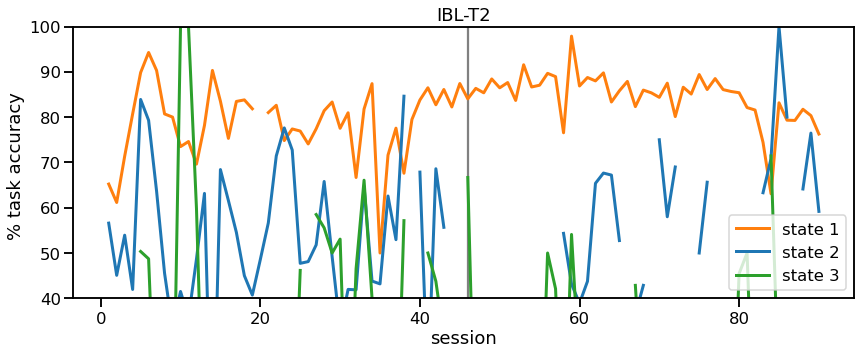

...

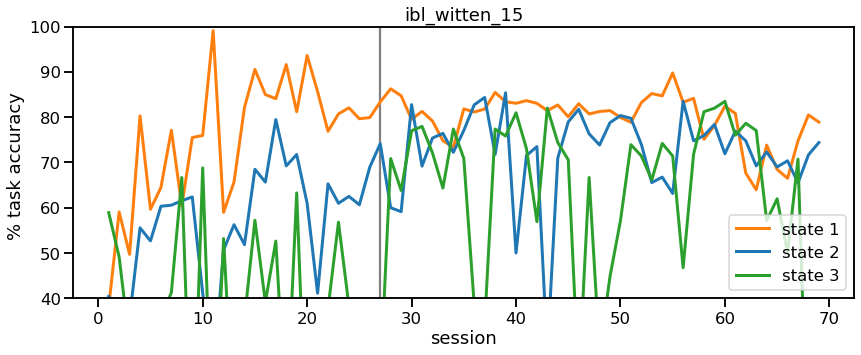

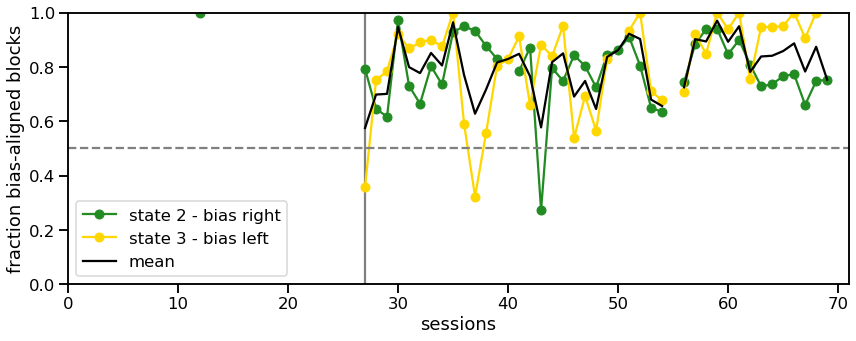

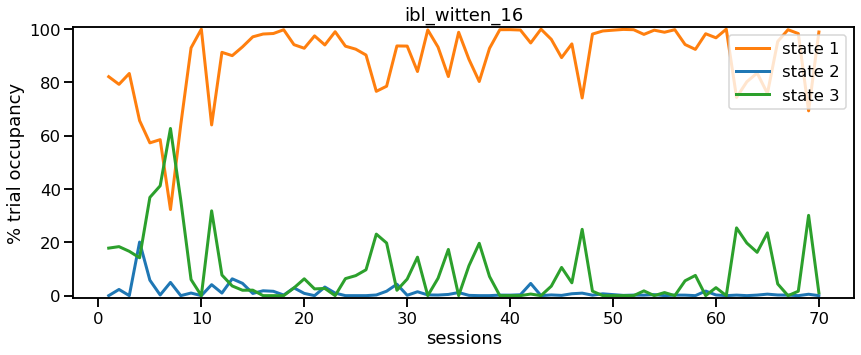

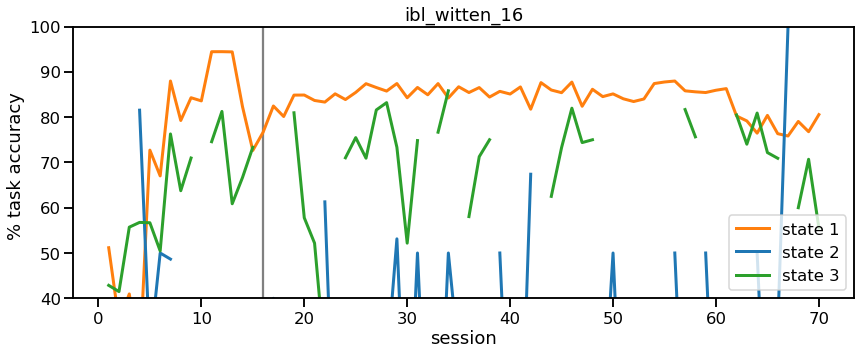

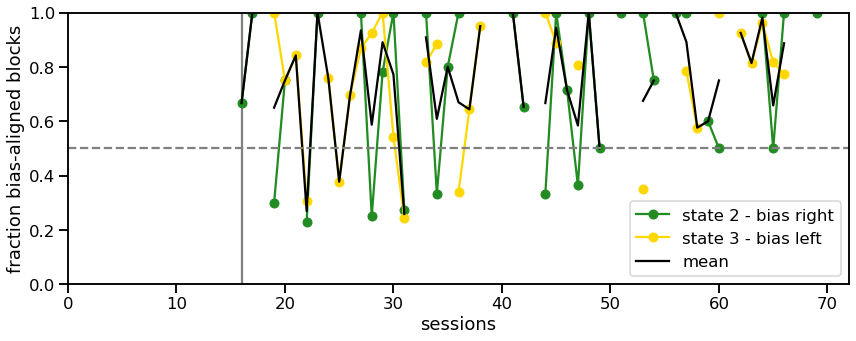

In [50]:
K = 3
allStateCount = np.empty((len(subjectsAll)), dtype=object)
allStateCorrect = np.empty((len(subjectsAll)), dtype=object)
blocksStateRight = np.empty((len(subjectsAll)), dtype=object)
blocksStateLeft = np.empty((len(subjectsAll)), dtype=object)

for idx in range(0,len(subjectsAll)):
    subject = subjectsAll[idx]
    x, y, sessInd, correctSide = get_mouse_design(dfAll, subject, sessStop=sessStop, D=D)
    biasedBlockTrials, biasedBlockStartInd, biasedBlockSession, firstBlockSession = get_design_biased_blocks(dfAll, subject, sessInd, sessStop)

    # Plotting task occupancy of each state across sessions
    fig, axes = plt.subplots(1, figsize = (14,5))#, dpi=400)
    axes.set_title(subject)
    allStateCount[idx] = plot_state_occupancy_sessions(allGamma[idx], sessInd, axes, colors=colorsStates)
    axes.set_ylim(-1,101)

    # plotting task accuracy in each state across sessions
    fig, axes = plt.subplots(1, figsize = (14,5))#, dpi=400)
    axes.set_title(subject)
    allStateCorrect[idx] = plot_task_accuracy_states_sessions(allGamma[idx], y, correctSide, sessInd, axes, firstBlockSession=firstBlockSession, colors=colorsStates)
    axes.set_ylim(40,100)

    # Plotting alignment of biased states with biased blocks
    fig, axes = plt.subplots(1, figsize=(14,5))
    blocksStateRight[idx], blocksStateLeft[idx] = plot_aligned_fraction_blocks_state(allGamma[idx], sessInd, biasedBlockTrials, biasedBlockSession, axes)

    axes.axvline(firstBlockSession+1, color='gray', zorder=0)

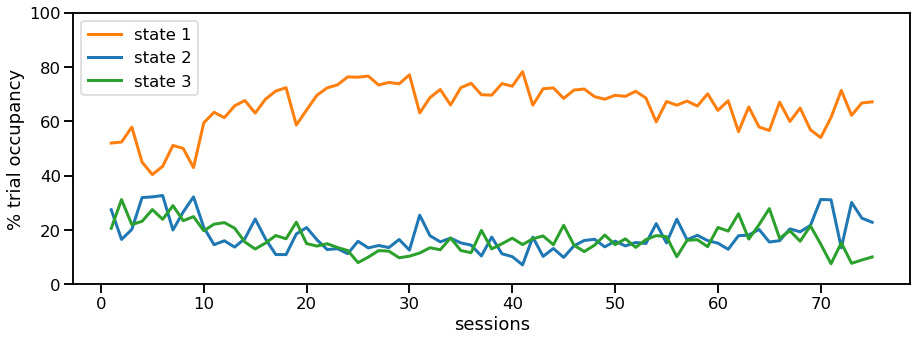

In [51]:
# Plotting weights and transition matrix averaged across all animals - first 70 sessions
maxSess = 75
bestSigmaInd = 7
K = 3

arrStateCount = np.ma.empty((maxSess,K,len(subjectsAll)))
arrStateCount.mask = True

fig, axes = plt.subplots(1, figsize = (15,5))#, dpi=400)
for idx in range(0,len(subjectsAll)):
    subject = subjectsAll[idx] 
    _, _, sessInd, _ = get_mouse_design(dfAll, subject, sessStop=sessStop, D=D)

    stop = min(len(sessInd)-1, maxSess)
    arrStateCount[:stop, :K, idx] = allStateCount[idx][:stop]
   
for k in range(0,K):
    axes.plot(range(1,maxSess+1), np.nanmean(arrStateCount[:,k,:], axis=1), color=colorsStates[k], linewidth=3, label=f'state {k+1}')
axes.set_ylabel('% trial occupancy')
axes.set_xlabel('sessions')
axes.set_ylim(0,100)
axes.legend(loc='upper left')


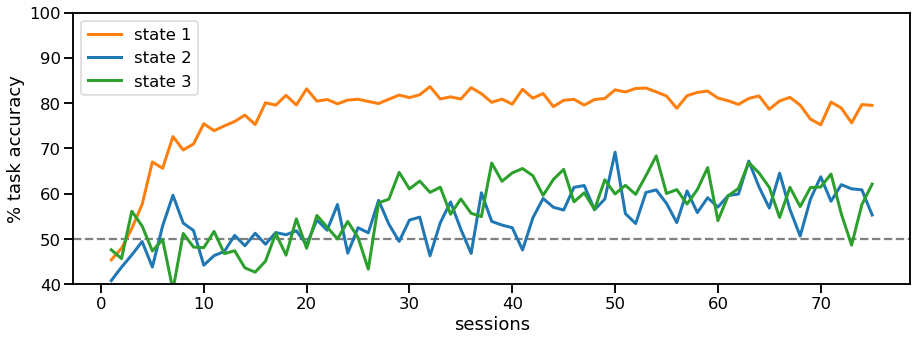

In [52]:
# Plotting weights and transition matrix averaged across all animals - first 70 sessions
maxSess = 75
bestSigmaInd = 7
K = 3

arrStateCorrect = np.ma.empty((maxSess,K,len(subjectsAll)))
arrStateCorrect.mask = True

fig, axes = plt.subplots(1, figsize = (15,5))#, dpi=400)
axes.axhline(50,color='gray',linestyle='dashed')
for idx in range(0,len(subjectsAll)):
    subject = subjectsAll[idx] 
    _, _, sessInd, _ = get_mouse_design(dfAll, subject, sessStop=sessStop, D=D)

    stop = min(len(sessInd)-1, maxSess)
    arrStateCorrect[:stop, :K, idx] = allStateCorrect[idx][:stop]
   
for k in range(0,K):
    axes.plot(range(1,maxSess+1), np.nanmean(arrStateCorrect[:,k,:], axis=1), color=colorsStates[k], linewidth=3, label=f'state {k+1}')
axes.set_ylabel('% task accuracy')
axes.set_xlabel('sessions')
axes.set_ylim(40,100)
axes.legend(loc='upper left')

Text(0, 0.5, 'biased block sessions')

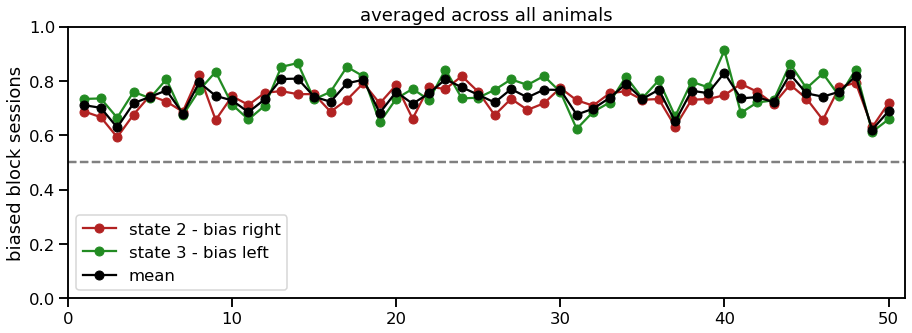

In [ ]:
# Average across animals of bias-block alignment with first biased session aligned across animals

# Plotting weights and transition matrix averaged across all animals - first 70 sessions
maxSess = 50
bestSigmaInd = 7
K = 3

arrAlignRight = np.ma.empty((maxSess,len(subjectsAll)))
arrAlignRight.mask = True

arrAlignLeft = np.ma.empty((maxSess,len(subjectsAll)))
arrAlignLeft.mask = True

fig, axes = plt.subplots(1, figsize = (15,5))#, dpi=400)
axes.axhline(0.5,color='gray',linestyle='dashed')
axes.set_title('averaged across all animals')
for idx in range(0,len(subjectsAll)):
    subject = subjectsAll[idx] 
    _, _, sessInd, _ = get_mouse_design(dfAll, subject, sessStop=sessStop, D=D)
    _, _, _, firstBlockSession = get_design_biased_blocks(dfAll, subject, sessInd, sessStop)
    if (np.isnan(firstBlockSession) == False):
        stop = min(len(sessInd)-1, firstBlockSession+maxSess)
        arrAlignRight[:stop-firstBlockSession, idx] = blocksStateRight[idx][firstBlockSession:stop]
        arrAlignLeft[:stop-firstBlockSession, idx] = blocksStateLeft[idx][firstBlockSession:stop]
        
axes.plot(range(1,maxSess+1), np.nanmean(arrAlignRight[:,:], axis=1), '-o', color='firebrick', label='state 2 - bias right', alpha=1)
axes.plot(range(1,maxSess+1), np.nanmean(arrAlignLeft[:,:], axis=1), '-o', color='forestgreen', label='state 3 - bias left', alpha=1)
axes.plot(range(1,maxSess+1), (np.nanmean(arrAlignRight[:,:], axis=1)+np.nanmean(arrAlignLeft[:,:], axis=1))/2, '-o', color='black',label='mean')
axes.legend()
axes.set_xlim(0,maxSess+1)
axes.axhline(0.5,color='gray',linestyle='dashed')
axes.set_ylim(0,1)
axes.set_ylabel('biased block sessions')
